## Project 4 - Advanced Lane Lines

**Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Import Packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import math
import os
import glob
import re

# To allow plotting images more than maximum without getting error
plt.rcParams.update({'figure.max_open_warning': 0})

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import imageio
#imageio.plugins.ffmpeg.download()

### Show Images Function

In [2]:
# Function to display two images side by side
def show_images(img1, title1, img2, title2):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,15))
    if len(img1.shape) == 2:
        ax1.imshow(img1, cmap='gray')
    else:
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    ax1.set_title(title1, fontsize=20)
    
    if len(img2.shape) == 2:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax2.set_title(title2, fontsize=20)

### Save Images Function

In [3]:
# Function to save images in destination folder
def save_images(img, foldername, filename):
    if not os.path.exists('output_images/' + foldername):
        os.makedirs('output_images/' + foldername)
    cv2.imwrite('output_images/'+ foldername + '/' + filename, img)

## Step 1. Camera Calibration
Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

**Load sample calibration image to count number of interior corners in x and y direction**

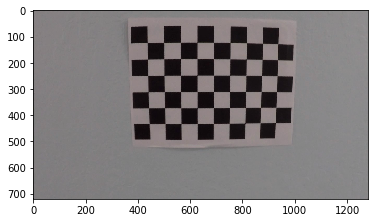

In [4]:
sample_cal_img = cv2.imread('camera_cal/calibration18.jpg')
plt.imshow(sample_cal_img)
img_shape = sample_cal_img.shape
img_size = (img_shape[1], img_shape[0])

In [5]:
# Function for camera calibration
def calibrate_camera(calibration_images, nx, ny):
    # Array to store object points and image points from all images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane

    # Prepare object points like (0,0,0), (1,0,0), (2,0,0) ..., (6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x,y coordinates
    
    fig, axs = plt.subplots(5,4, figsize = (16, 12))
    fig.subplots_adjust(hspace = 0.2, wspace = 0.1)
    axs = axs.ravel()

    for i, path in enumerate(calibration_images):
        dirname, filename = os.path.split(path)
        
        # Read in each image
        img = cv2.imread(dirname + '/' + filename)

        # Convert image to grayscale 
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        # Create a copy of image for drawng chessboard corners
        cbc = img.copy()
        
        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            
            # Draw and display the corners
            cv2.drawChessboardCorners(cbc, (nx,ny), corners, ret)

            axs[i].axis('off')
            axs[i].imshow(cbc)
            axs[i].set_title(filename, y = -0.2)
    
    # Compute camera calibration matrix calibration and distortion coefficients using object and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    return mtx, dist

**Draw Chessboard Corners**

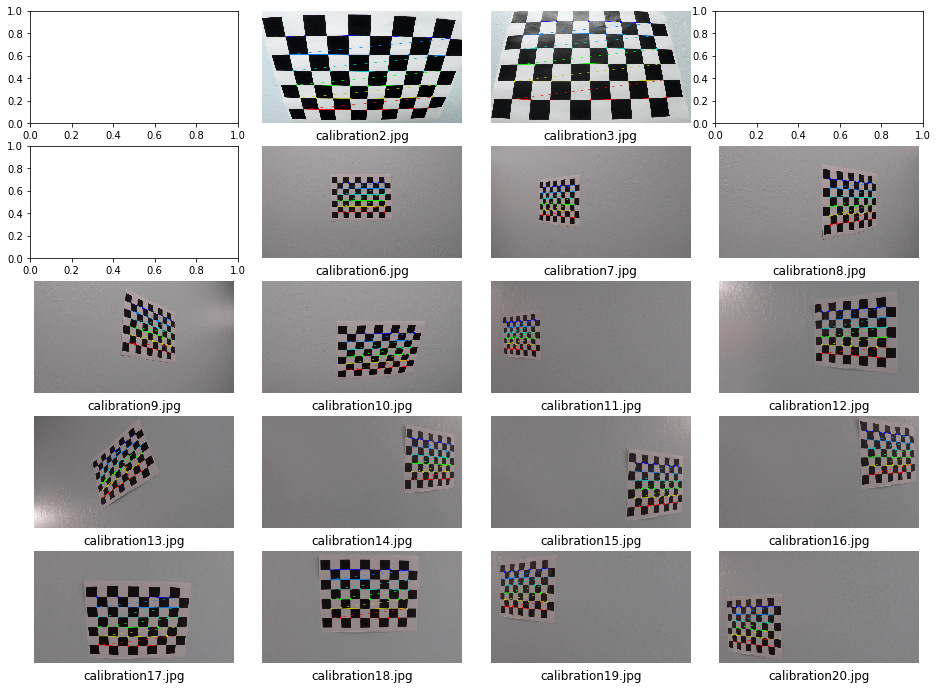

In [6]:
# Function to convert string to numbers to sort the image files
def convert(str):
    return int("".join(re.findall("\d*", str)))

# Load and make list of chessboard images for camera calibration
calibration_images = sorted(glob.glob('camera_cal/calibration*.jpg'), key=convert)

nx = 9 # Number of interior corners in the x direction
ny = 6 # Number of interior corners in the y direction

# Obtain mtx and dist from camera calibration for distotion correction
mtx, dist = calibrate_camera(calibration_images, nx, ny)

**Chessboard corners are not drawn on on Calibration Images 1, 4, and 5 as all the chessboard corners are not found.**

## Step 2. Distortion Correction
Apply a distortion correction to raw images.

In [7]:
# Function for distortion correction
def undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

**Visualize Distortion Correction on a Chessboard Image**

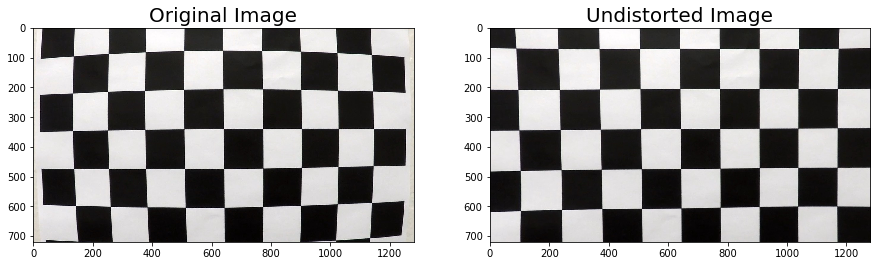

In [8]:
dist_img = cv2.imread('camera_cal/calibration1.jpg')
undist = undistort(dist_img)
show_images(dist_img, 'Original Image', undist, 'Undistorted Image')

**Load All Test Images**

In [9]:
# Load and make a list of all test images
test_images = sorted(glob.glob('test_images/*.jpg'))

**Visualize Distortion Correction on Test Images**

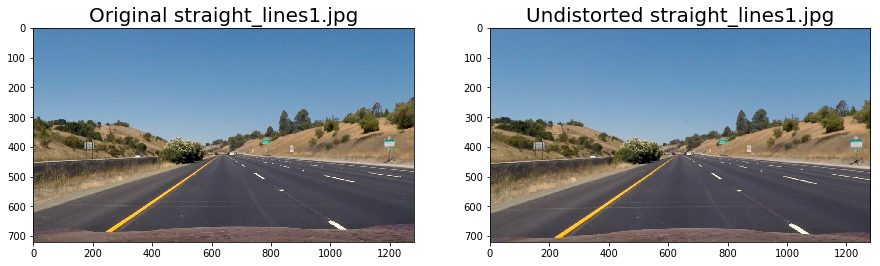

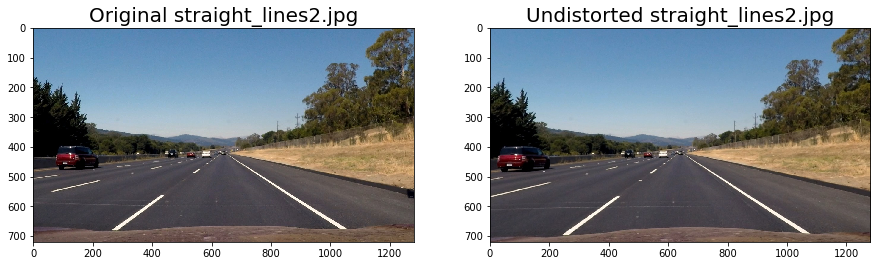

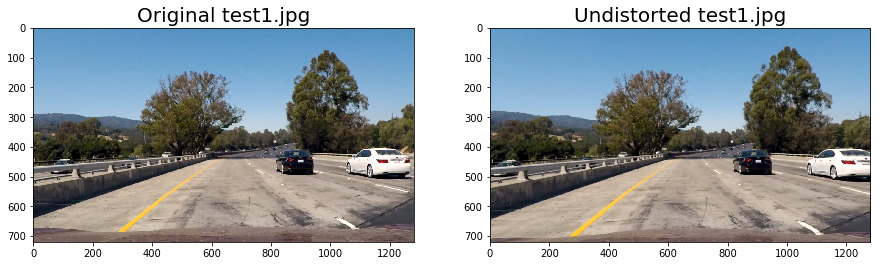

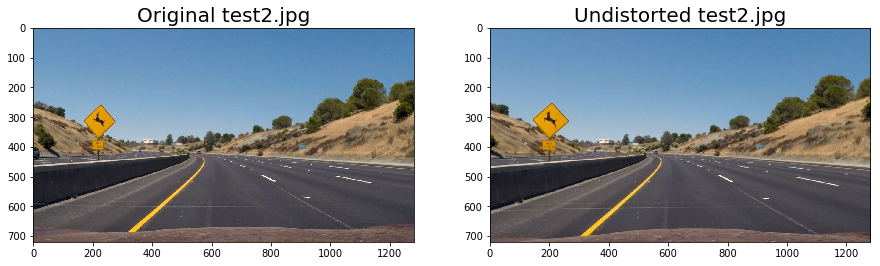

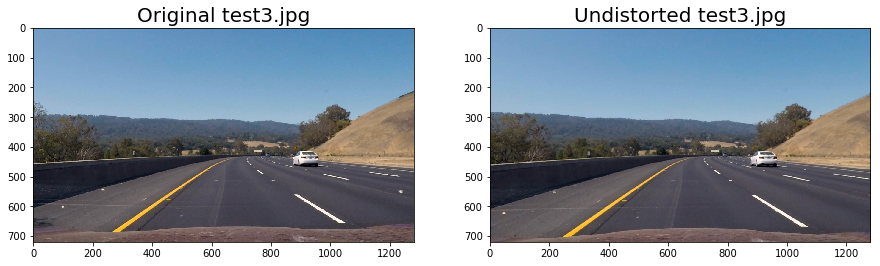

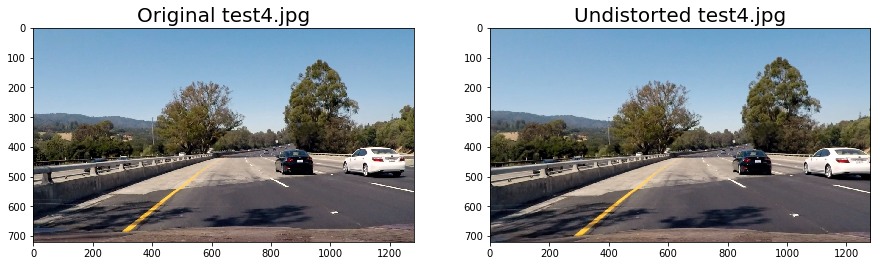

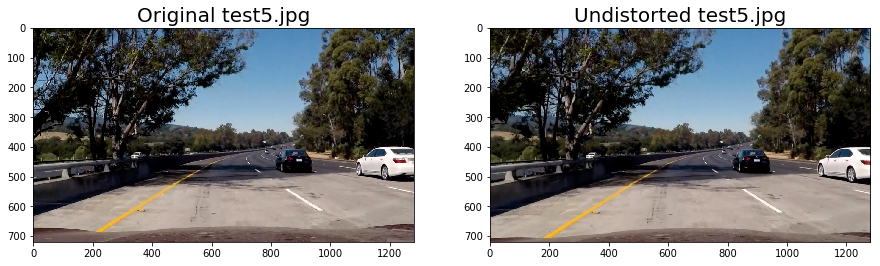

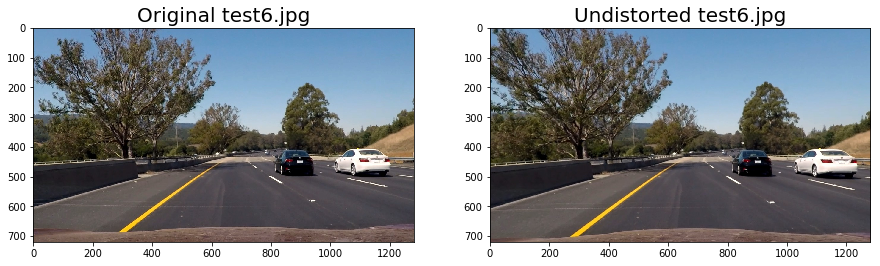

In [10]:
# Perform distortion correction on test images
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)

    # Distortion correction
    undist = undistort(img)
    
    show_images(img, 'Original '+ filename, undist, 'Undistorted '+ filename)
    save_images(undist, '1_Distortion_Correction', filename)

## Step 3. Color / Gradient Threshold
Use color transforms, gradients, etc., to create a thresholded binary image.

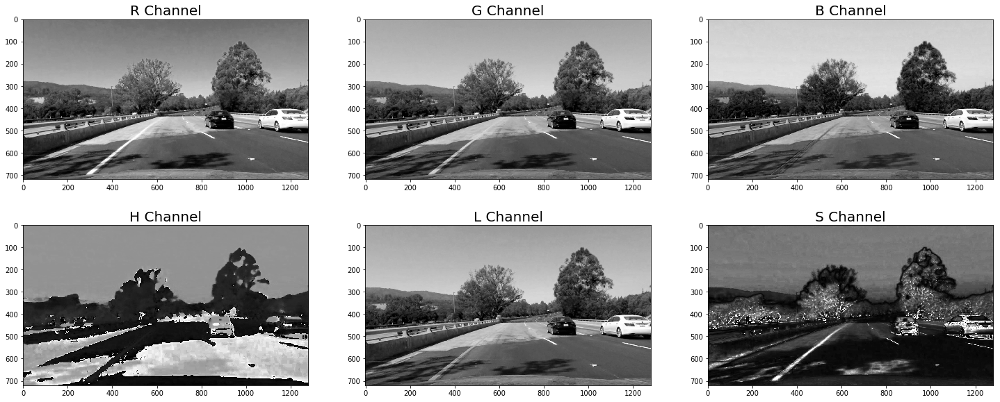

In [11]:
# Examining individual channels for RBG and HLS color spaces
sample_img = cv2.imread('output_images/1_Distortion_Correction/test4.jpg')

img_B = sample_img[:,:,0]
img_G = sample_img[:,:,1]
img_R = sample_img[:,:,2]

img_HLS = cv2.cvtColor(sample_img, cv2.COLOR_BGR2HLS)
img_H = img_HLS[:,:,0]
img_L = img_HLS[:,:,1]
img_S = img_HLS[:,:,2]

fig, axs = plt.subplots(2, 3, figsize=(25,10))
axs = axs.ravel()
axs[0].imshow(img_R, cmap='gray')
axs[0].set_title('R Channel', fontsize=20)
axs[1].imshow(img_G, cmap='gray')
axs[1].set_title('G Channel', fontsize=20)
axs[2].imshow(img_B, cmap='gray')
axs[2].set_title('B Channel', fontsize=20)
axs[3].imshow(img_H, cmap='gray')
axs[3].set_title('H Channel', fontsize=20)
axs[4].imshow(img_L, cmap='gray')
axs[4].set_title('L Channel', fontsize=20)
axs[5].imshow(img_S, cmap='gray')
axs[5].set_title('S Channel', fontsize=20)

**From the above images of separate channels, we see that R-channel from the RGB color sapce and S-channel from the HLS color space very well identifies the yellow colored lane line in case of shadows and varying gradients of lighting on road surfaces.**

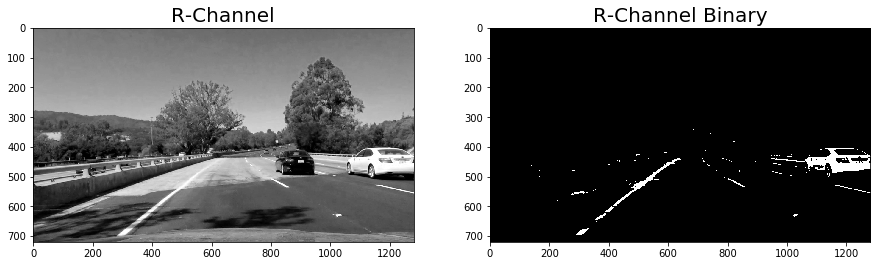

In [12]:
# Function to threshold the R-channel of RGB
def R_thresh(img, thresh):
    img_R = img[:,:,2]
    r_binary = np.zeros_like(img_R)
    r_binary[(img_R >= thresh[0]) & (img_R <= thresh[1])] = 1
    return r_binary

r_thresh = (220,255)
r_binary = R_thresh(sample_img, r_thresh)
show_images(img_R, 'R-Channel', r_binary, 'R-Channel Binary')

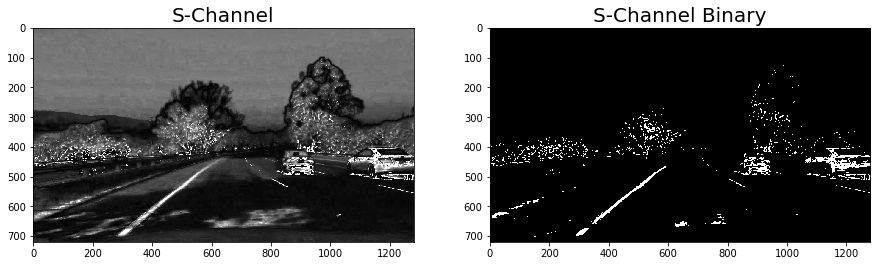

In [13]:
# Function that thresholds the S-channel of HLS
def S_thresh(img, thresh):
    img_HLS = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    img_S = img_HLS[:,:,2]
    s_binary = np.zeros_like(img_S)
    s_binary[(img_S >= thresh[0]) & (img_S <= thresh[1])] = 1
    return s_binary

s_thresh = (150,255)
s_binary = S_thresh(sample_img, s_thresh)
show_images(img_S, 'S-Channel', s_binary, 'S-Channel Binary')

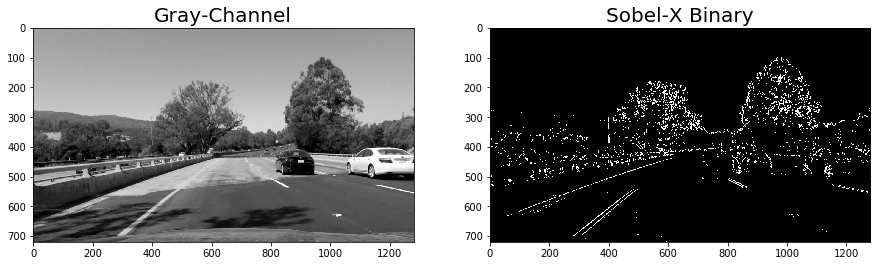

In [14]:
# Function to apply Sobel thresholds
def Sx_thresh(img, thresh):
    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sx_binary = np.zeros_like(scaled_sobel)
    sx_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sx_binary

sx_thresh = (30,100)
sx_binary = Sx_thresh(sample_img, sx_thresh)
gray = cv2.cvtColor(sample_img, cv2.COLOR_BGR2GRAY)
show_images(gray, 'Gray-Channel', sx_binary, 'Sobel-X Binary')

**Combining the binary outputs of R-channel from RGB color space and S-channel from HLS color space.**

In [15]:
# Function to apply color and gradient threshold for binary image
def binary(img):
    # Apply threshold to R-channel
    r_thresh = (220, 255)
    r_binary = R_thresh(img, r_thresh)

    # Apply threshold to S-channel
    s_thresh = (150, 255)
    s_binary = S_thresh(img, s_thresh)
    
    sx_thresh = (30, 255)
    sx_binary = Sx_thresh(img, sx_thresh)

    # Combine the binary thresholds
    combined_binary = np.zeros_like(r_binary)
    combined_binary[(r_binary == 1) | (s_binary == 1) | (sx_binary == 1)] = 1
    
    return combined_binary

**Visualize Color / Gradient Threshold on Test Images**

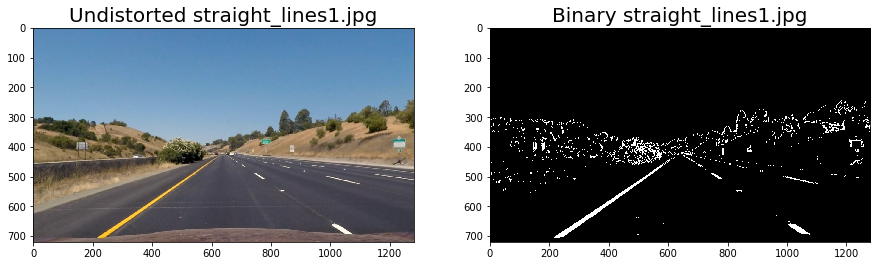

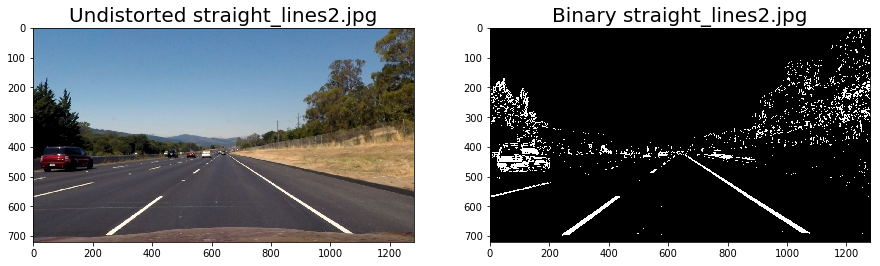

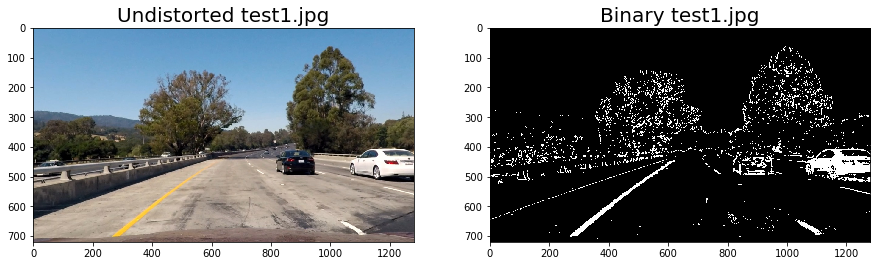

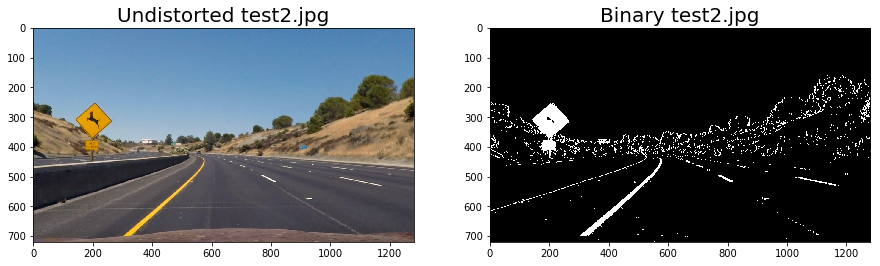

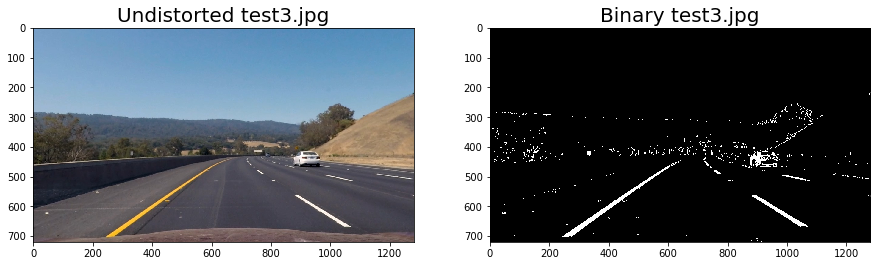

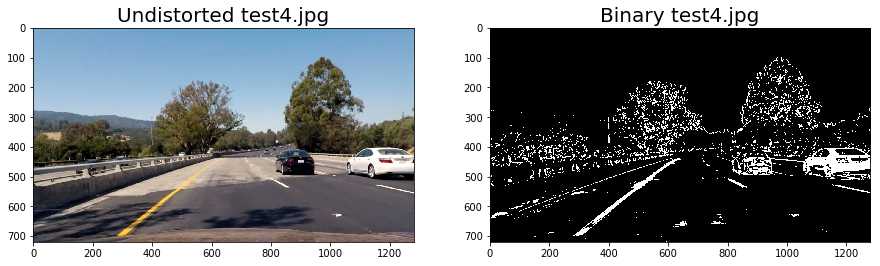

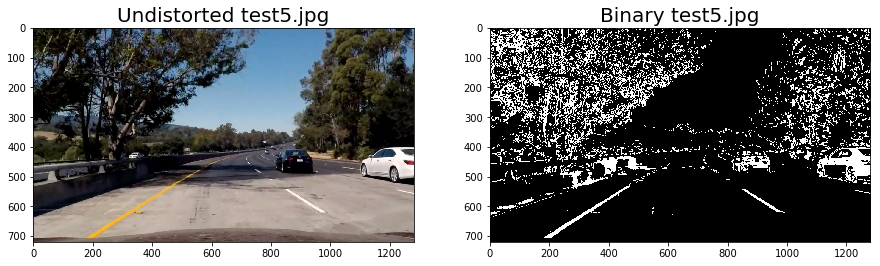

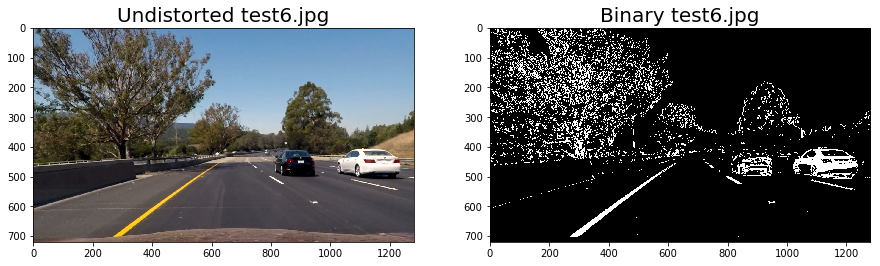

In [16]:
# Perform binary threshold on test images
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Create thresholded binary image
    binary_output = binary(undistort(img))
    
    show_images(undistort(img), 'Undistorted ' + filename, binary_output, 'Binary ' + filename)
    binary_output = np.dstack((binary_output, binary_output, binary_output)).astype(np.uint8) * 255
    save_images(binary_output, '2_Combined_Binary', filename)

## Step 4. Perspective Transform
Apply a perspective transform to rectify binary image ("birds-eye view").  
**Note:** Assuming the road is always relatively flat and the camera position is fixed, a fixed perspective transform may be appropriate.

In [17]:
# Function to draw polygon to visualize perspective transform
def draw_polygon(img, pts):
    if len(img.shape) == 2:
        img = np.dstack((img, img, img)).astype('uint8')*255
        
    line_image = np.copy(img)
    for i in range(len(pts)):
        x1, y1 = pts[i-1]
        x2, y2 = pts[i]
        cv2.line(line_image,(x1,y1),(x2,y2),(0,0,255),10)
    
    return line_image

In [18]:
# Function to perform perspective transform on a distortion corrected image
def warp(img, src, dst, operation):
    
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp image to a top-down view
    if operation == 'Warp':
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        return warped
    # Unwarp blank lane lines image to original image space
    elif operation == 'Unwarp':
        unwarped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
        return unwarped

In [19]:
# Define source and destination points for perspective transform
src_bottom_left  = [  205, 720 ]
src_bottom_right = [ 1110, 720 ]
src_top_left     = [  580, 460 ]
src_top_right    = [  705, 460 ]

dst_bottom_left  = [  320, 720 ]
dst_bottom_right = [  960, 720 ]
dst_top_left     = [  320,   0 ]
dst_top_right    = [  960,   0 ]

src = np.float32([src_bottom_left,src_bottom_right,src_top_right,src_top_left])
dst = np.float32([dst_bottom_left,dst_bottom_right,dst_top_right,dst_top_left])

**Visualize Perspective Transform on Test Images**

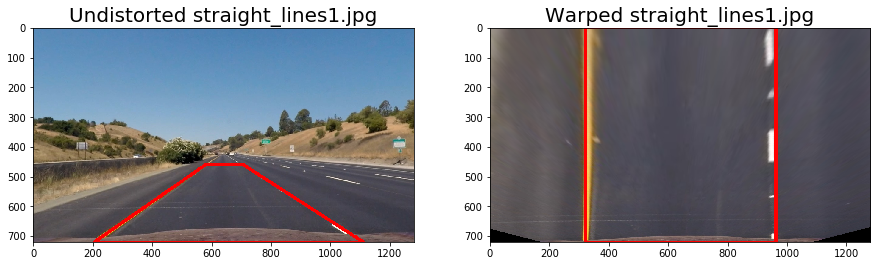

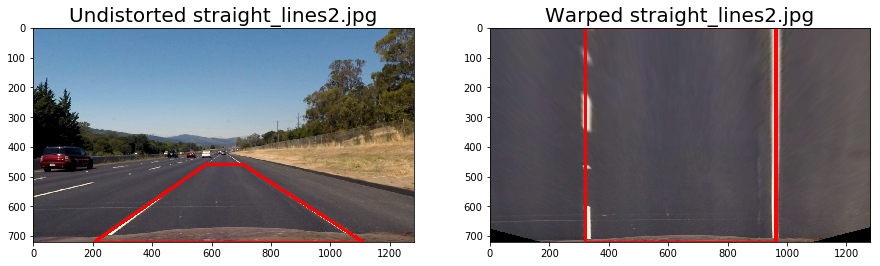

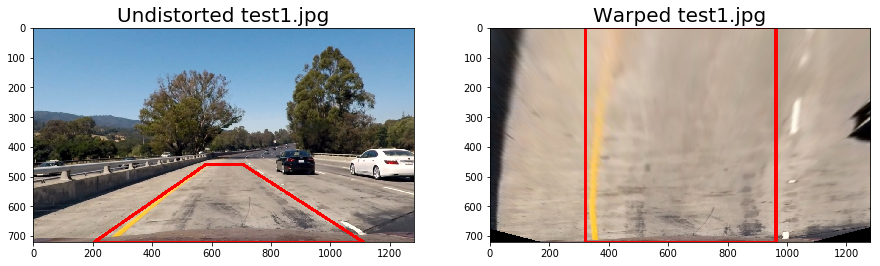

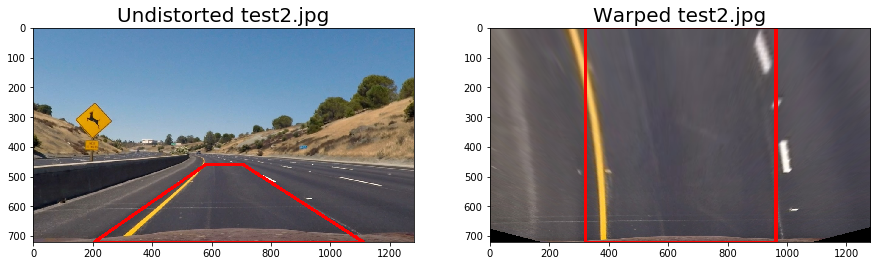

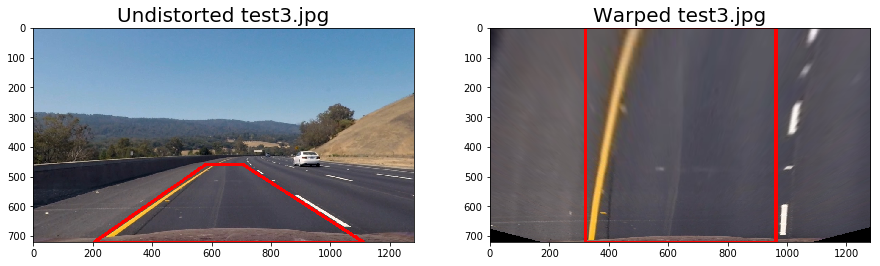

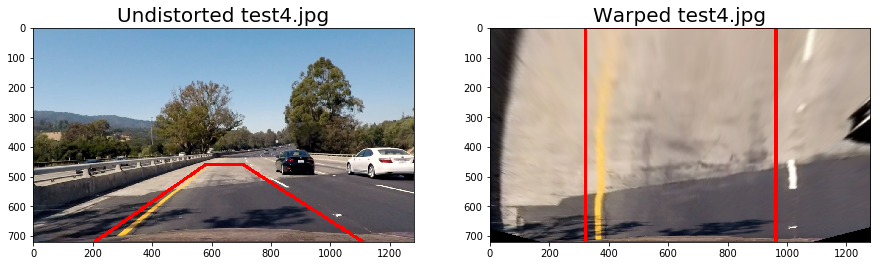

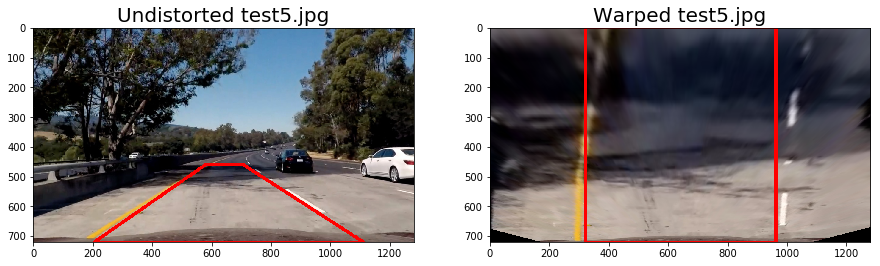

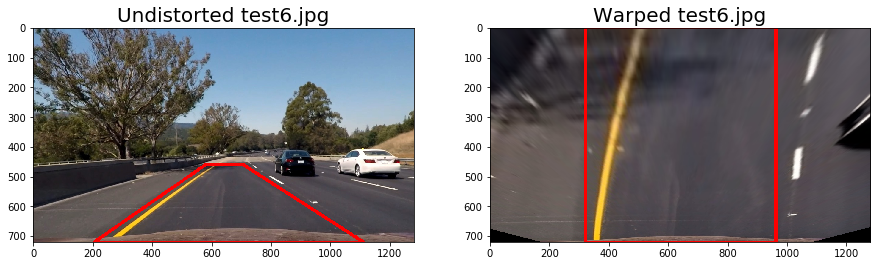

In [21]:
# Perform perspective transform on test images
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform
    warped = warp(undistort(img), src, dst, 'Warp')
    
    # Draw polygon on undistorted image
    undist_poly = draw_polygon(undistort(img), src)
    # Draw polygon on warped image
    warped_poly = draw_polygon(warped, dst)
    
    show_images(undist_poly, 'Undistorted '+ filename, warped_poly, 'Warped '+ filename)
    save_images(warped, '3_Perspective_Transform', filename)

**Visualize Perspective Transform on Binary Images**

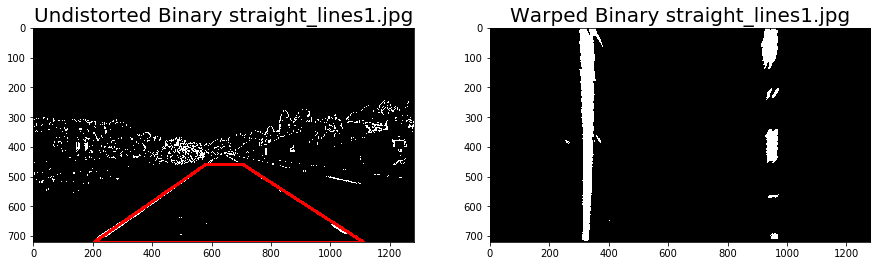

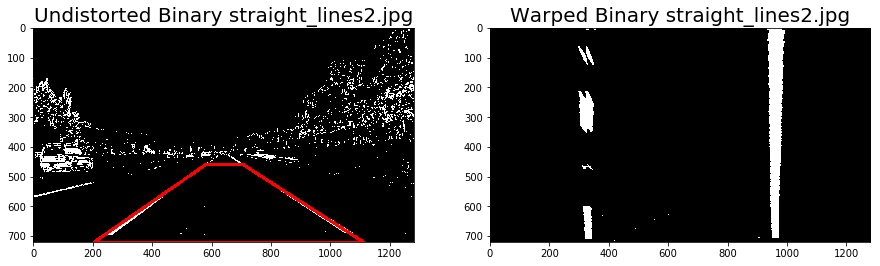

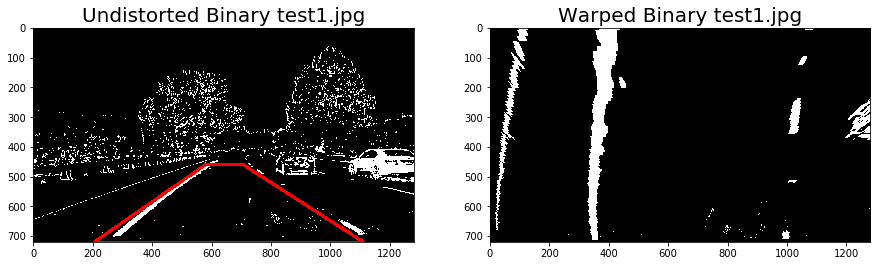

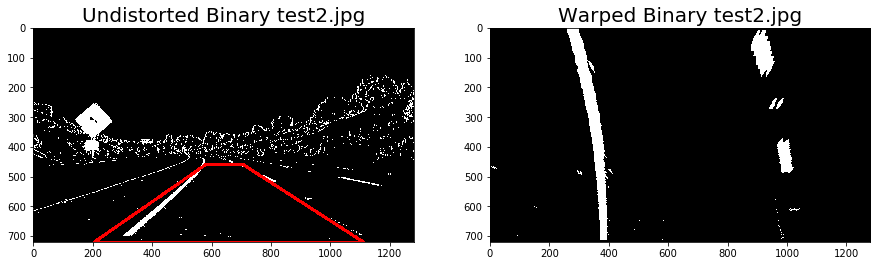

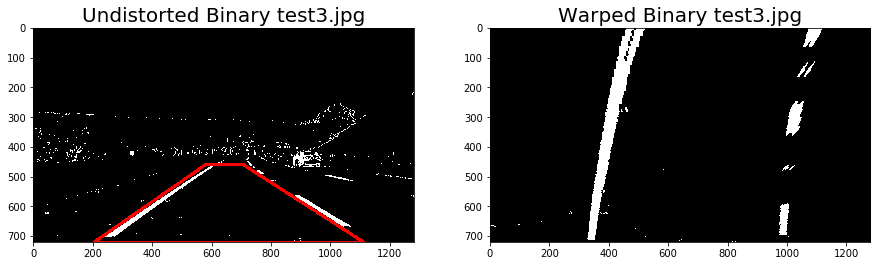

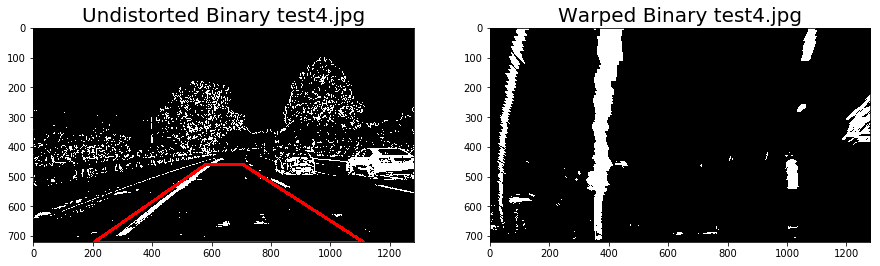

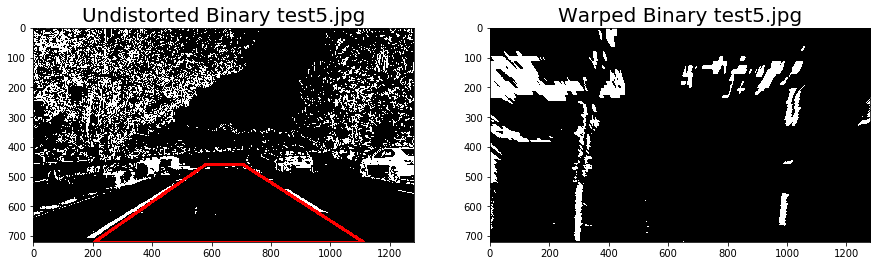

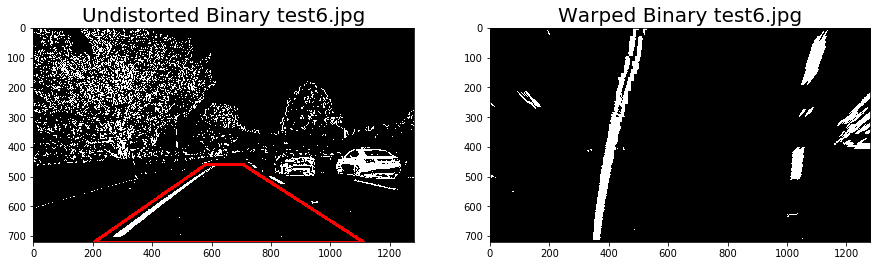

In [20]:
# Perform perspective transform on binary images
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = warp(binary(undistort(img)), src, dst, 'Warp')
    
    # Draw polygon on undistorted binary image
    binary_output_poly = draw_polygon(binary(undistort(img)), src)
    
    show_images(binary_output_poly, 'Undistorted Binary '+ filename, warped_binary, 'Warped Binary '+ filename)
    warped_binary = np.dstack((warped_binary, warped_binary, warped_binary)).astype(np.uint8) * 255
    save_images(warped_binary, '4_Warped_Binary', filename)

**Apply Region of Interest**

In [22]:
def region_of_interest(img):
    
    # Vertices for region of interest
    vertices = np.array([[(250,720),(250,0),(1150,0),(1150,720)]], dtype=np.int32)
    
    # Defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    # Defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

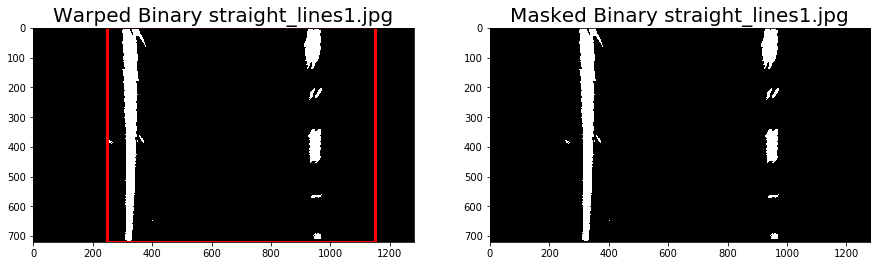

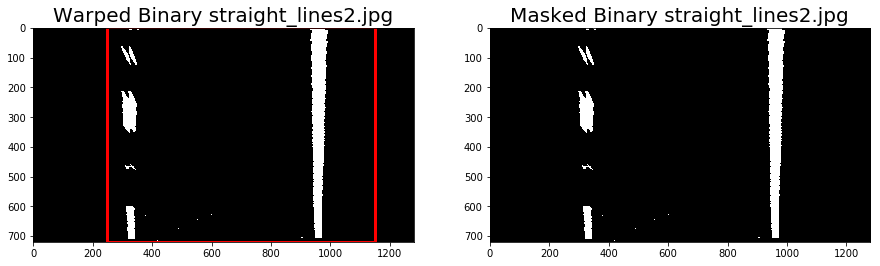

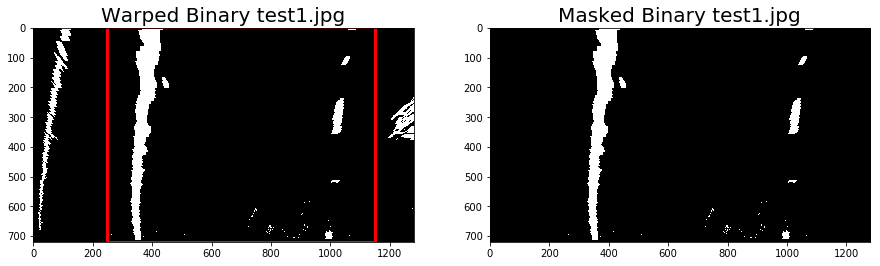

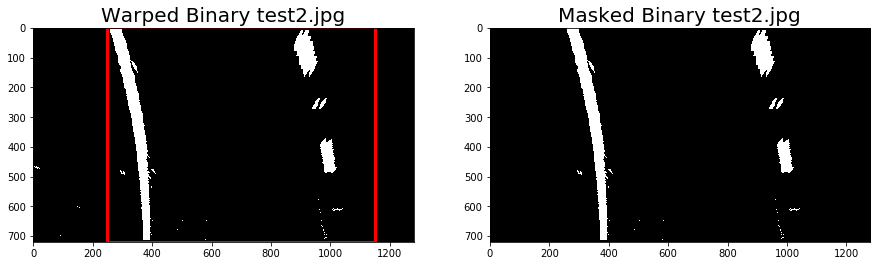

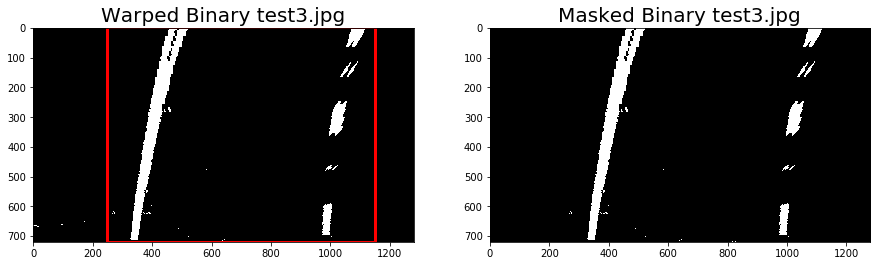

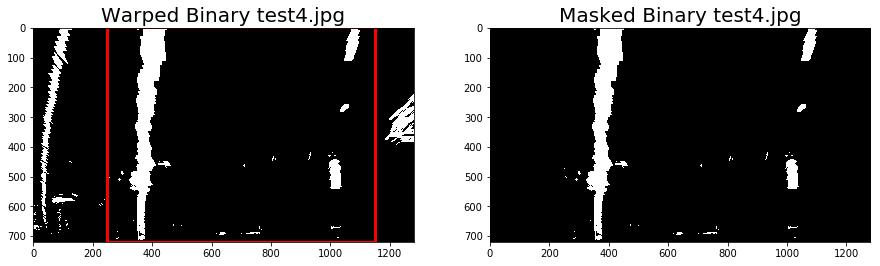

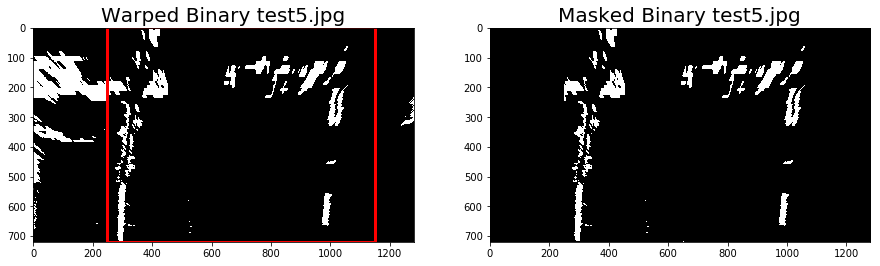

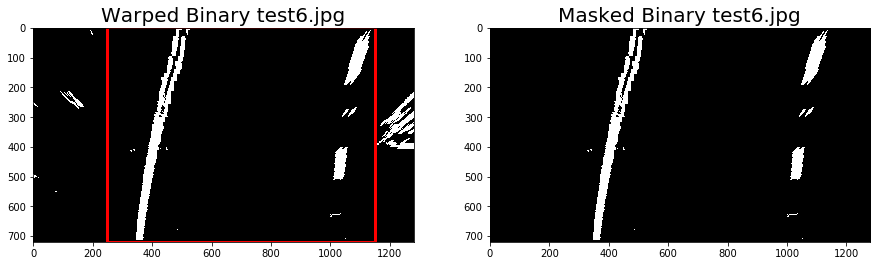

In [23]:
# Perform binary threshold masking on test images
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = warp(binary(undistort(img)), src, dst, 'Warp')
    
    # Points for region of interest
    pts = np.float32([[250,720],[250,0],[1150,0],[1150,720]])
    
    # Create a masked warped binary image
    masked_binary = region_of_interest(warped_binary)
    
    # Draw polygon on undistorted binary image
    warped_binary_poly = draw_polygon(warped_binary, pts)
    
    show_images(warped_binary_poly, 'Warped Binary ' + filename, masked_binary, 'Masked Binary ' + filename)
    masked_binary = np.dstack((masked_binary, masked_binary, masked_binary)).astype(np.uint8) * 255
    save_images(masked_binary, '5_Masked_Binary', filename)

## Step 5. a) Detect Lane Lines
Detect lane pixels and fit to find the lane boundary

In [24]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/700 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
xm_per_pix = 3.7/640   # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters

# Function to fit polynomial to binary image with lines extracted, using sliding window
def slidingwindow_polyfit(binary_warped):
    # Input image should be a warped binary image
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right lanes in the expected region of the histogram
    # These will be the starting point for the left and right lines
    leftx_base = np.argmax(histogram[200:500]) + 200
    rightx_base = np.argmax(histogram[800:1100]) + 800
    
    # Create an output image to draw on and visualize the result
    out_img = 255*np.dstack((binary_warped, binary_warped, binary_warped)).astype('uint8')
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, histogram, out_img

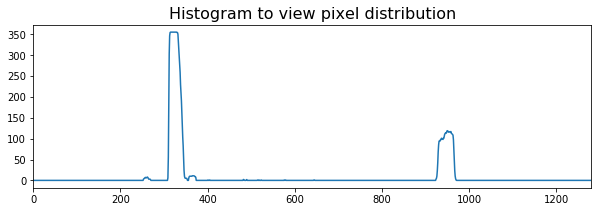

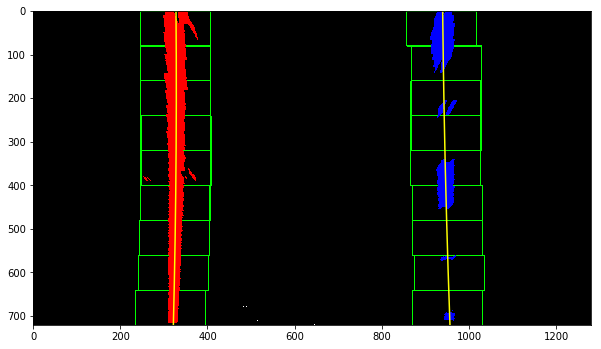

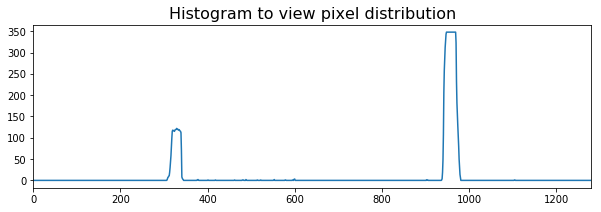

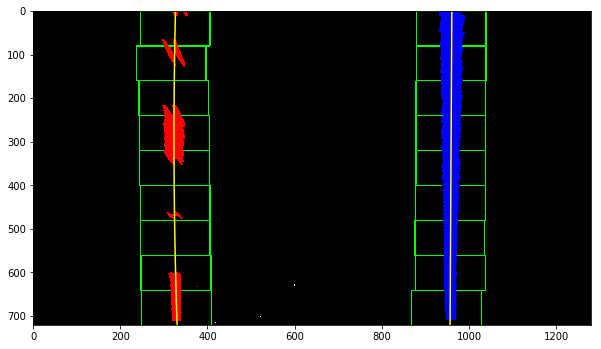

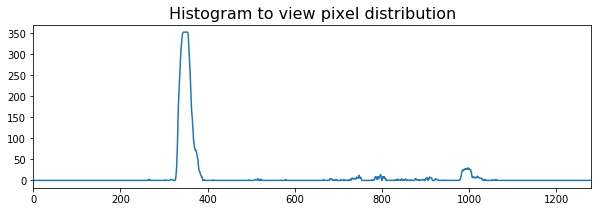

...

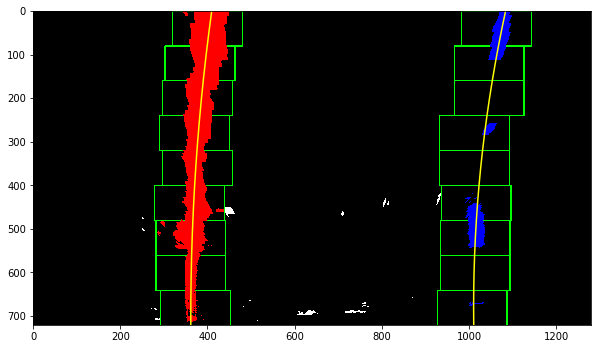

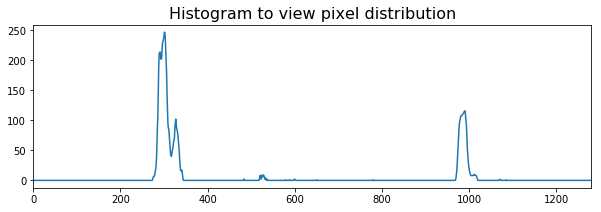

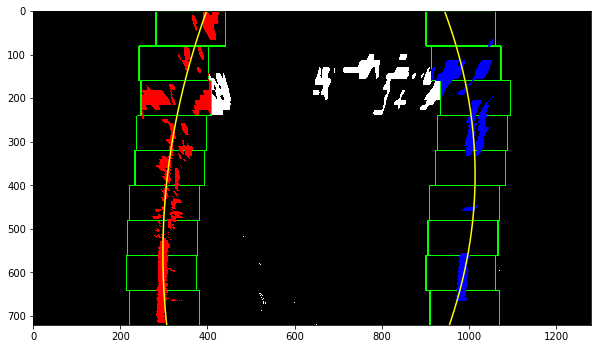

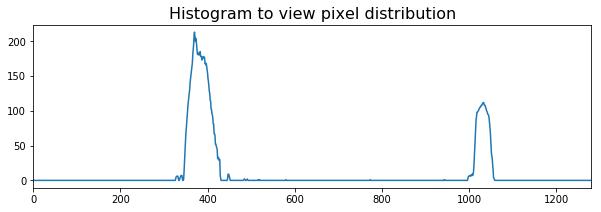

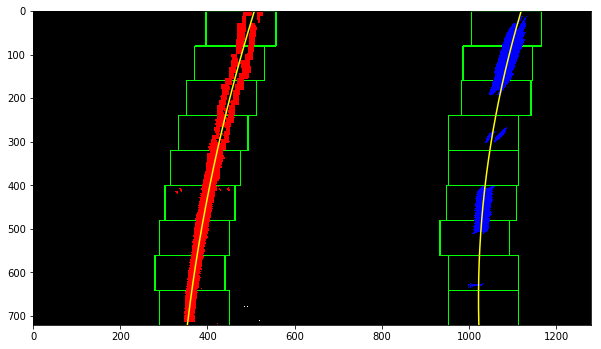

In [25]:
# Detect lane pixel using sliding window and polynomial fit
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    
    # Detect lane pixel using sliding window and polynomial fit
    left_fit, right_fit, left_lane_inds, right_lane_inds, histogram, out_img = slidingwindow_polyfit(warped_binary)
    
     # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary.shape[0]-1, warped_binary.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    plt.figure(figsize=(10,3))
    plt.plot(histogram)
    plt.title('Histogram to view pixel distribution', fontsize=16)
    plt.xlim(0, 1280)

    plt.figure(figsize=(10,10))
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    save_images((cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)), '6_SlidingWindow_PlyFit', filename)

## Step 5. b) Detect lane lines from previous fit

In [26]:
# Function to detect lane pixel using previous fit
def polyfit_using_prev_fit(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

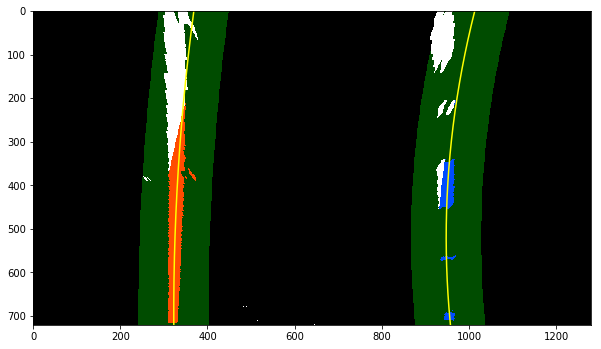

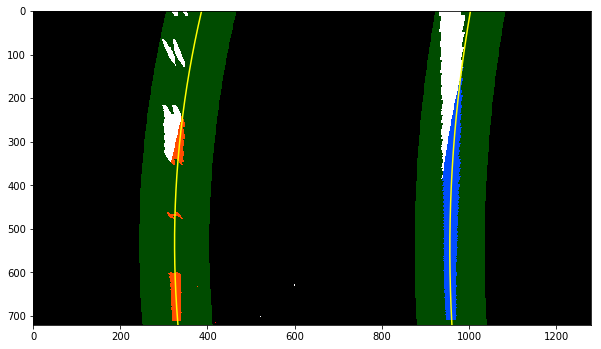

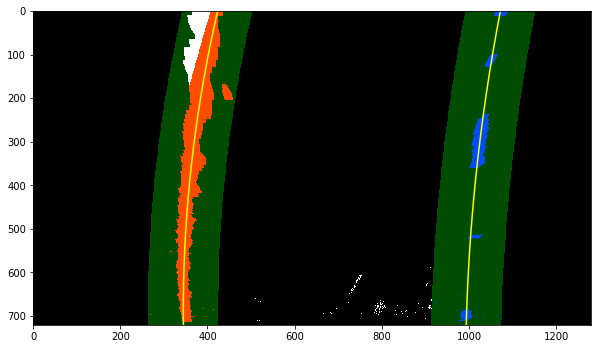

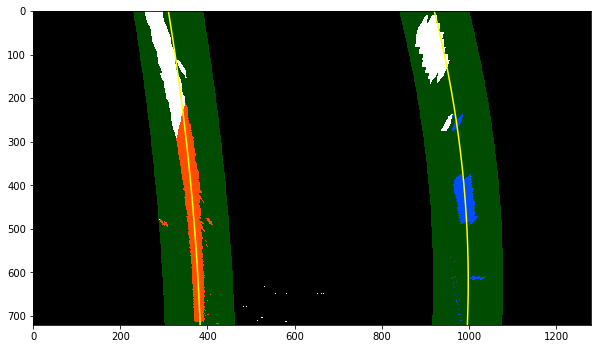

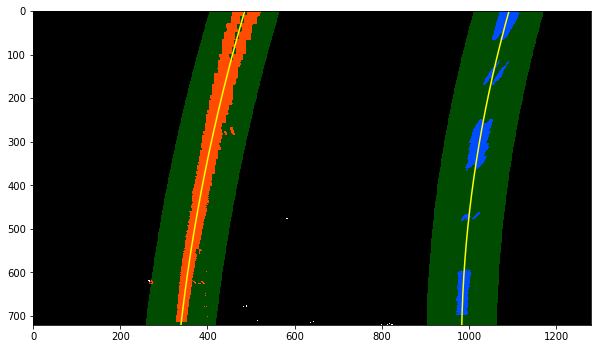

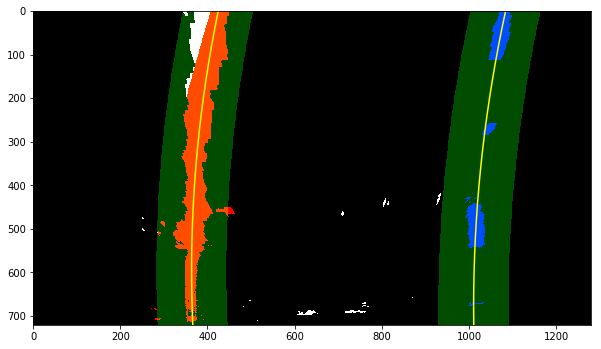

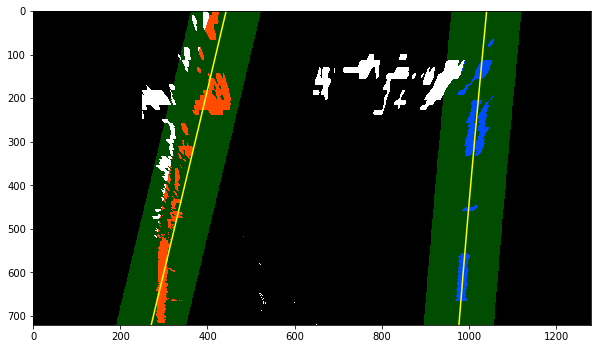

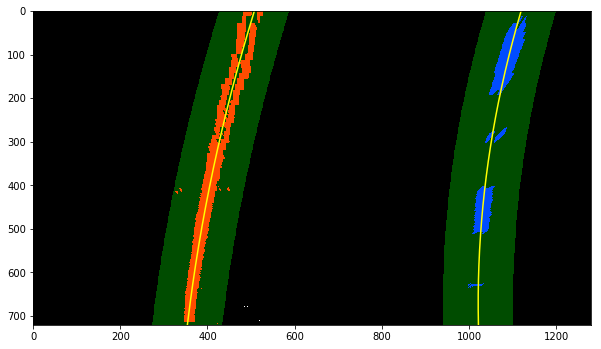

In [27]:
# Detect lane pixel using previous fit
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    
    # Detect lane pixel using previous fit
    left_fit_new, right_fit_new, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(warped_binary, left_fit, right_fit)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary.shape[0]-1, warped_binary.shape[0])
    left_fitx_new = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
    right_fitx_new = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped_binary, warped_binary, warped_binary))*255
    window_img = np.zeros_like(out_img)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx_new-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx_new+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx_new-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx_new+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    lane_pixel_prev_fit = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    plt.figure(figsize=(10,10))
    plt.imshow(lane_pixel_prev_fit)
    plt.plot(left_fitx_new, ploty, color='yellow')
    plt.plot(right_fitx_new, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    save_images((cv2.cvtColor(lane_pixel_prev_fit, cv2.COLOR_BGR2RGB)), '7_Lane_Pixel_Previous_Fit', filename)

## Step 6. Determine Lane Curvature
Determine the curvature of the lane and vehicle position with respect to center.

In [28]:
# Function to measure radius of curvature
def measure_radius_of_curvature(binary_warped, left_fit, right_fit):
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    y_eval = np.max(ploty)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the radii of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

In [29]:
# Function to determine offset from the center
def center_offset(binary_warped, left_fit, right_fit):
    
    car_center = (binary_warped.shape[1]/2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    y_eval = np.max(ploty)
    
    left_fitx = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_fitx = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    
    lane_center = (left_fitx + right_fitx)/2
    cntr_ofst = (car_center-lane_center)*xm_per_pix
    
    return cntr_ofst

In [30]:
# Determine the curvature of the lane and vehicle position with respect to center
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    
    # Detect lane pixel using sliding window and polynomial fit
    left_fit, right_fit, _, _, _, _ = slidingwindow_polyfit(warped_binary)

    # Determine radius of curvature
    left_curve_rad, right_curve_rad = measure_radius_of_curvature(warped_binary, left_fit, right_fit)
    print(filename)
    print('Left Lane Radius of Curvature:  %.2f m'% left_curve_rad)
    print('Right Lane Radius of Curvature: %.2f m'% right_curve_rad)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Average Radius of Curvature:    %.2f m" % average_curve_rad
    print(curvature_string)

    # Determine center offset
    cntr_ofst = center_offset(warped_binary, left_fit, right_fit)
    offset_string = "Center Offset: %.3f m" % cntr_ofst
    print(offset_string)
    print('------------------------------------------')

straight_lines1.jpg
Left Lane Radius of Curvature:  6922.29 m
Right Lane Radius of Curvature: 8794.15 m
Average Radius of Curvature:    7858.22 m
Center Offset: 0.005 m
------------------------------------------
straight_lines2.jpg
Left Lane Radius of Curvature:  4060.57 m
Right Lane Radius of Curvature: 315441.52 m
Average Radius of Curvature:    159751.05 m
Center Offset: -0.020 m
------------------------------------------
test1.jpg
Left Lane Radius of Curvature:  3380.51 m
Right Lane Radius of Curvature: 1375.89 m
Average Radius of Curvature:    2378.20 m
Center Offset: -0.153 m
------------------------------------------
test2.jpg
Left Lane Radius of Curvature:  700.28 m
Right Lane Radius of Curvature: 733.67 m
Average Radius of Curvature:    716.98 m
Center Offset: -0.313 m
------------------------------------------
test3.jpg
Left Lane Radius of Curvature:  1303.33 m
Right Lane Radius of Curvature: 888.08 m
Average Radius of Curvature:    1095.71 m
Center Offset: -0.122 m
---------

## Step 7. Inverse Transform
Warp the detected lane boundaries back onto the original image.

In [30]:
# Function to warp the detected lane lines back onto the original image
def inverse_transform(binary_warped, img, left_fit, right_fit):
    # Create an image to draw the lines on
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    left_line_window = np.array(np.transpose(np.vstack([left_fitx, ploty])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
    line_points = np.vstack((left_line_window, right_line_window))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(out_img, np.int_([line_points]), [0, 255, 0])
    cv2.polylines(out_img, np.int32([left_line_window]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(out_img, np.int32([right_line_window]), isClosed=False, color=(255,255,0), thickness=15)

    # Unwarp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped_raw = warp(out_img, src, dst, 'Unwarp')
    
    # Combine the result with the original image
    unwarped = cv2.addWeighted(img, 1, unwarped_raw, 0.3, 0)
    
    return unwarped

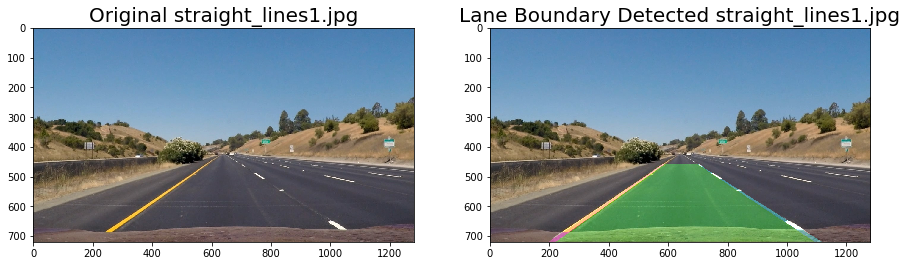

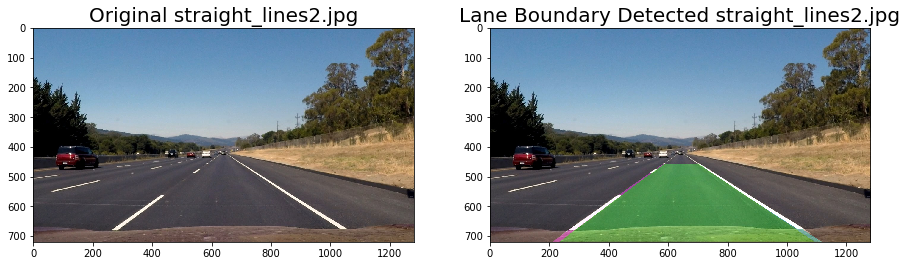

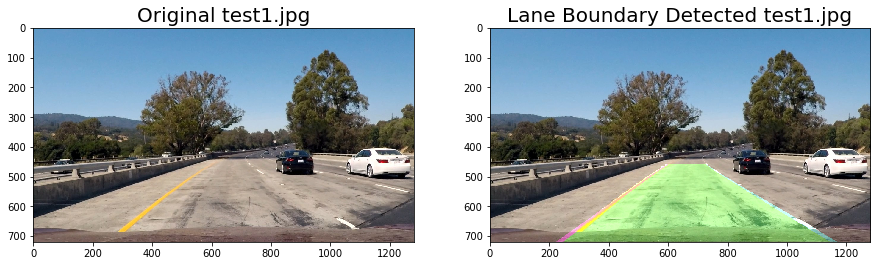

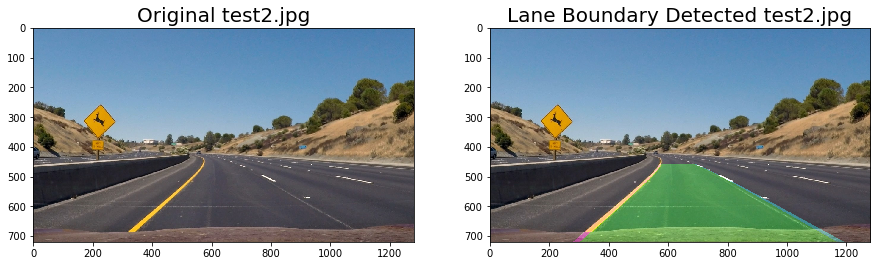

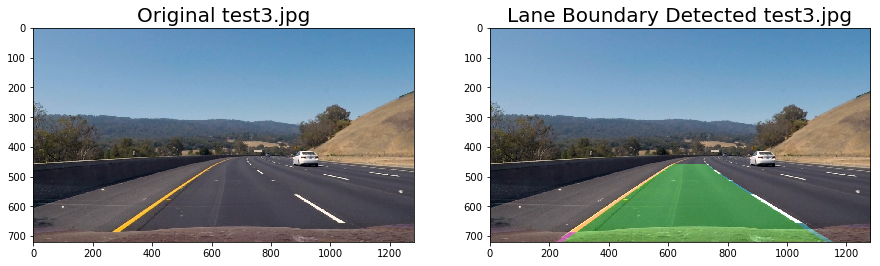

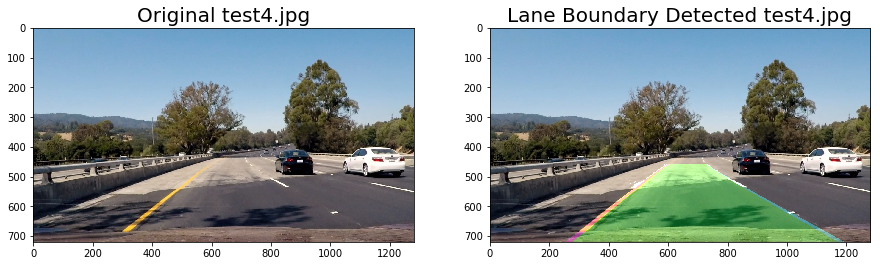

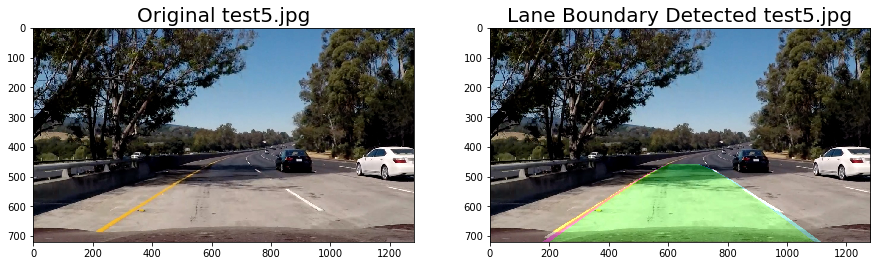

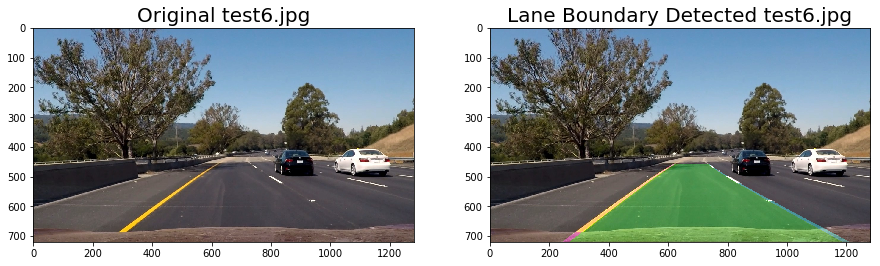

In [31]:
# Perform inverse transform to warp the detected lane lines back onto the original image
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    img = cv2.imread(path)
    
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    
    # Detect lane pixel using sliding window and polynomial fit
    left_fit, right_fit, _, _, _, _ = slidingwindow_polyfit(warped_binary)
    
    # Inverse transform
    unwarped = inverse_transform(warped_binary, img, left_fit, right_fit)
    
    show_images(img, 'Original ' + filename, unwarped, 'Lane Boundary Detected ' + filename)
    save_images(unwarped, '8_Inverse_Transform', filename)

## Step 8. Draw Curvature Radius and Distance from Center Data onto the Original Image
Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [32]:
# Function to output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position
def visual_data(original_img, curv_rad, cntr_ofst):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if cntr_ofst > 0:
        direction = 'Right'
    elif cntr_ofst < 0:
        direction = 'Left'
    abs_cntr_ofst = abs(cntr_ofst)
    text = '{:04.3f}'.format(abs_cntr_ofst) + 'm ' + direction + ' of Center'
    new_img = cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

## Putting all together to create a pipeline to detect lane boundary with visual data on all test images

In [33]:
def process_image(img):
    # Distortion correction
    undist = undistort(img)
    # Binary threshold
    binary_output = binary(undist)
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    # Detect lane pixel using sliding window and polynomial fit
    left_fit, right_fit, _, _, _, _ = slidingwindow_polyfit(warped_binary)
    # Determine radius of curvature
    left_curve_rad, right_curve_rad = measure_radius_of_curvature(warped_binary, left_fit, right_fit)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    # Compute the offset from the center
    cntr_ofst = center_offset(warped_binary, left_fit, right_fit)
    # Inverse transform
    unwarped = inverse_transform(warped_binary, img, left_fit, right_fit)
    # Draw curvature radius and distance from center data onto the original image
    unwarped_data = visual_data(unwarped, average_curve_rad, cntr_ofst)
    return unwarped_data

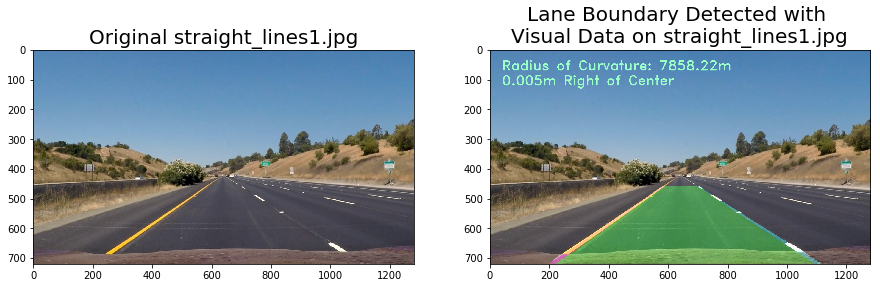

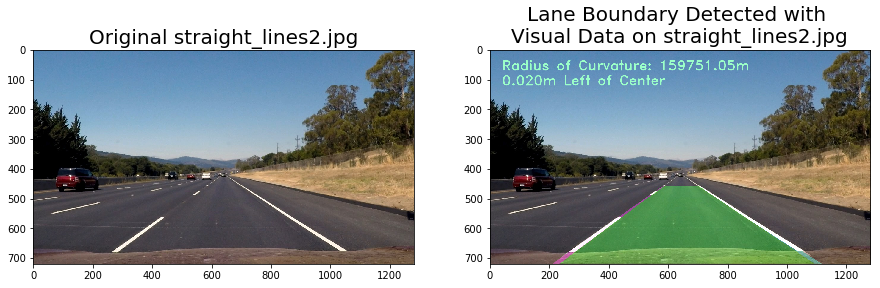

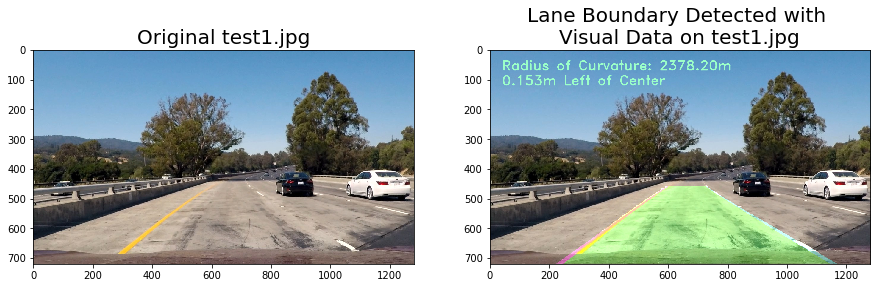

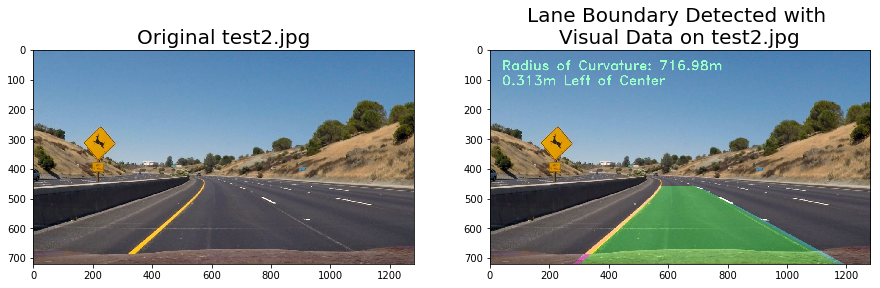

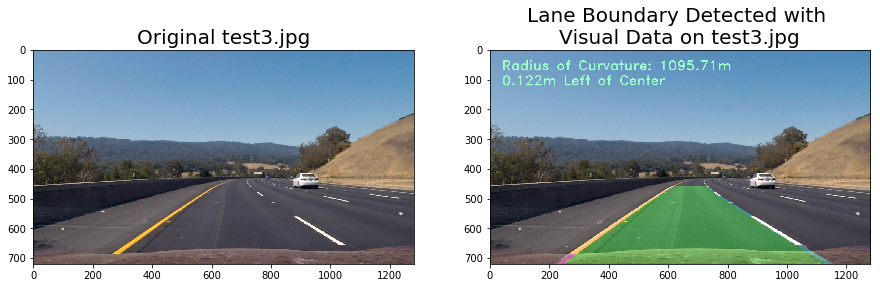

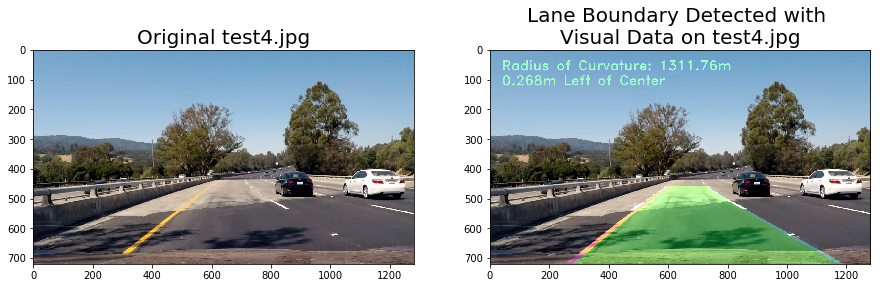

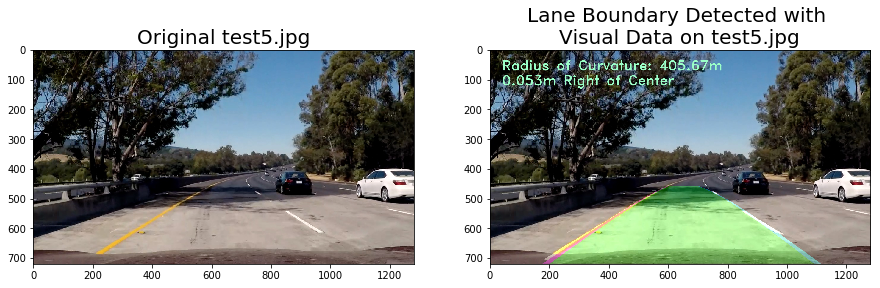

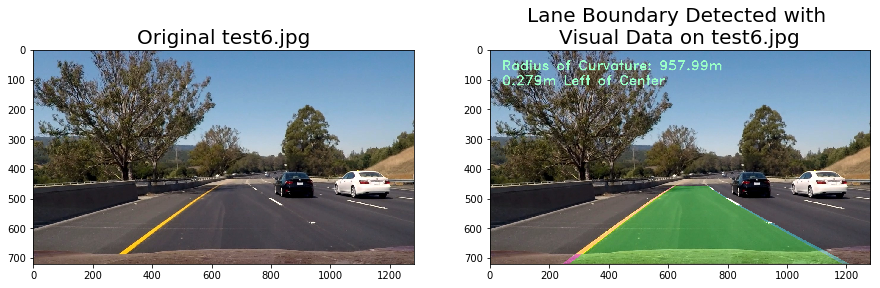

In [34]:
# Load and make a list of all test images
test_images = sorted(glob.glob('test_images/*.jpg'))

# Load pipeline to draw curvature radius and distance from center data onto the originalimage
for path in test_images:
    dirname, filename = os.path.split(path)
    # Read in each image
    img = cv2.imread(path)
    # Call the process_image() pipeline to draw curvature radius and distance from center data onto the original image
    unwarped = process_image(img)
    
    show_images(img, 'Original ' + filename,  unwarped, 'Lane Boundary Detected with \nVisual Data on ' + filename)
    save_images(unwarped, '9_Inverse_Transform_Visual_Data', filename)

## Pipeline to draw lane lines on the test videos

In [35]:
# Define a class to receive the characteristics of each lane detection
class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.leftCurvature = None
        self.rightCurvature = None

In [36]:
# Creating instances of left and right lanes of class Lane()
leftLane = Lane()
rightLane = Lane()

def process_video(img):
    # Distortion correction
    undist = undistort(img)
    # Binary threshold
    binary_output = binary(undist)
    # Perspective transform on binary image
    warped_binary = region_of_interest(warp(binary(undistort(img)), src, dst, 'Warp'))
    # Detect lane pixel using sliding window and polynomial fit
    left_fit, right_fit, _, _, _, _ = slidingwindow_polyfit(warped_binary)
    # Determine radius of curvature
    left_curve_rad, right_curve_rad = measure_radius_of_curvature(warped_binary, left_fit, right_fit)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    # Compute the offset from the center
    cntr_ofst = center_offset(warped_binary, left_fit, right_fit)

    if left_curve_rad > 10000 or left_fit is None:
        left_fit = leftLane.left_fit
        left_curve_rad = leftLane.leftCurvature
    else:
        leftLane.left_fit = left_fit
        leftLane.leftCurvature = left_curve_rad

    if right_curve_rad > 10000 or right_fit is None:
        right_fit = rightLane.right_fit
        right_curve_rad = rightLane.rightCurvature
    else:
        rightLane.right_fit = right_fit
        rightLane.rightCurvature = right_curve_rad
    
    # Inverse transform
    unwarped = inverse_transform(warped_binary, img, left_fit, right_fit)
    # Draw curvature radius and distance from center data onto the original image
    unwarped_data = visual_data(unwarped, average_curve_rad, cntr_ofst)
    
    return unwarped_data

In [38]:
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'output_videos\project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_video)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video output_videos\project_video_output.mp4
[MoviePy] Writing video output_videos\project_video_output.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [05:01<00:00,  3.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\project_video_output.mp4 

Wall time: 5min 2s


In [40]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

In [37]:
#my_clip.write_gif('test.gif', fps=12)
video_output2 = 'output_videos\challenge_video_output.mp4'
video_input2 = VideoFileClip('challenge_video.mp4')#.subclip(22,26)
processed_video = video_input2.fl_image(process_video)
%time processed_video.write_videofile(video_output2, audio=False)

[MoviePy] >>>> Building video output_videos\challenge_video_output.mp4
[MoviePy] Writing video output_videos\challenge_video_output.mp4


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 485/485 [02:10<00:00,  3.65it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\challenge_video_output.mp4 

Wall time: 2min 12s


In [38]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output2))

In [39]:
#my_clip.write_gif('test.gif', fps=12)
video_output3 = 'output_videos\harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('harder_challenge_video.mp4')#.subclip(22,26)
processed_video = video_input3.fl_image(process_video)
%time processed_video.write_videofile(video_output3, audio=False)

[MoviePy] >>>> Building video output_videos\harder_challenge_video_output.mp4
[MoviePy] Writing video output_videos\harder_challenge_video_output.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [05:52<00:00,  3.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\harder_challenge_video_output.mp4 

Wall time: 5min 53s


In [40]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output3))